In [1]:
#Aquiagregamos todas las librerias
import numpy as np
import math
import random as rd
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
import matplotlib.animation as animation
from IPython.display import Image as IPImage
from IPython.display import display




In [2]:
# Algoritmo Gradient Evolution (GE)
def gradient_evolution(objective_function, dim, bounds, num_individuals, max_iter, c1, Jr, Sr, epsilon):
    # Paso 1: Inicialización
    PopHist=[]
    bestHist=[]
    BestPopHist=[]
    population = np.random.uniform(bounds[0], bounds[1], (num_individuals, dim))
    fitness = np.array([objective_function(ind) for ind in population])
    best_index = np.argmin(fitness)
    global_best = population[best_index].copy()
    global_best_fitness = fitness[best_index]
    updating_history = np.ones(num_individuals)
    c=np.linspace(c1[0],c1[1] , max_iter)
    # Iteraciones del algoritmo
    for iteration in range(max_iter):
        new_population = population.copy()
        poppulation_aux = population.copy()
        PopHist.append(new_population)

        for i in range(num_individuals):
            # Identificar los mejores y peores individuos
            best_neighbor = population[np.argmin(fitness)]
            worst_neighbor = population[np.argmax(fitness)]
           

            # Actualización de vectores 
            #Calculo del gradiante 
            if np.array_equal(population[i], global_best):  # Si es el mejor
                delta = c[iteration] + (np.abs(worst_neighbor - population[i])) / 2
                bj = population[i] - delta
                new_population[i] = population[i]-(np.random.uniform(0, 1, dim)*(delta/2))*((worst_neighbor - bj)/(worst_neighbor-population[i]+ bj))+np.random.uniform(0, 1, dim) * (global_best-population[i])
            elif np.array_equal(population[i], worst_neighbor):  # Si es el peor
                delta = c[iteration] + (np.abs(population[i]-best_neighbor )) / 2
                wj = population[i] + delta
                new_population[i] =population[i]-(np.random.uniform(0, 1, dim)*(delta/2))*((wj-best_neighbor)/(wj-population[i]+ best_neighbor))+np.random.uniform(0, 1, dim) * (global_best-population[i])
            else:  # Otros individuos
                rd.shuffle(poppulation_aux) #Revolvemos el vector poppulation_aux para obtener diferntes Xb y Xw
                A1=0 #Indicadores de si ya obtuvimos vecinos mejores o peores
                A2=0
                for q in poppulation_aux:
                    if objective_function(population[i])<objective_function(q) and A1==1: #Vecino peor
                        better_neighbor = q
                        A1=1
                    elif objective_function(population[i])>objective_function(q) and A2==1: #Vecino mejor
                        worse_neighbor = q
                        A2=1
                    
                delta = np.abs(population[i] - best_neighbor) / 2 + np.abs(worst_neighbor - population[i]) / 2
                new_population[i] = population[i] - (np.random.uniform(0, 1, dim)*(delta/2))*((worst_neighbor-best_neighbor)/(worst_neighbor-population[i]+ best_neighbor))+np.random.uniform(0, 1, dim)*(global_best-population[i])
            # Vector Jumping
            if np.random.rand() < Jr:
                new_population[i]=-new_population[i]+np.random.normal(0, 1, dim) * (new_population[i] - population[np.random.randint(0,num_individuals)])
                    
            #Restringimos el vector a las condiciones de Caja, se trunca al punto donde el vector intersecta la caja.
            
            if np.any(new_population[i]>bounds[1]) or np.any(new_population[i]<bounds[0]):
                    auxnp=new_population[i]/np.linalg.norm(new_population[i],np.inf) #Normalizamos vector de actualización(Norma infinito)
                    auxnp=auxnp*bounds[1] #Truncamos el vector al limite de caja superior
                    #Nota: Para estas pruebas todos los limites de caja son simetricos, habría que considerar el caso donde no lo fueran.
                    new_population[i]=auxnp
                    
            # Calcular aptitud
            
            new_fitness = objective_function(new_population[i])

            # Vector Refreshing
            if new_fitness < fitness[i]:
                fitness[i] = new_fitness
                population[i] = new_population[i]
            else:
                updating_history[i] -= epsilon * updating_history[i]
                if updating_history[i] < Sr:
                    population[i] = np.random.uniform(bounds[0], bounds[1], dim)
                    fitness[i] = objective_function(population[i])
                    updating_history[i] = 1

        # Actualizar el mejor vector global
        best_index = np.argmin(fitness)
        if fitness[best_index] < global_best_fitness:
            global_best = population[best_index].copy()
            global_best_fitness = fitness[best_index]
        bestHist.append(fitness[best_index])
        BestPopHist.append(global_best_fitness)
        # Imprimir progreso
        #print(f"Iteración {iteration + 1}/{max_iter}, Mejor Fitness: {global_best_fitness}")

    return global_best, global_best_fitness, PopHist, bestHist, BestPopHist

In [3]:
#En este modulo se insertan todasla funciones para testear que aparecen en tabla 1 de 
#The gradient evolution algorithm: A new metaheuristic
def Sphere(x):
    return sum([xi**2 for xi in x])
def WeightedSphere(x):
    return sum([(i+1)*xi**2 for i, xi in enumerate(x)])
def SumOfDifferentPower(x):
    return sum([abs(xi) ** (i + 1) for i, xi in enumerate(x)])
def StepFunction (x):
    return sum([math.floor(xi+0.5)**2 for xi in x])
def Schwefel1_2(x):
    sum_j = 0
    for i in range(1, len(x) + 1):
        sum_i = sum(x[:i])#Suma hasta el elemento i
        sum_j += sum_i**2
    return sum_j
def Schwefel2_2(x):
    return sum([abs(xi) for xi in x])+np.prod([abs(xi) for xi in x])
def rosenbrock(x):
    sum_i = 0
    #Se toma D-1 para que la función pueda quedar dentro de los limites del indice
    for i in range(len(x) - 1):
        sum_i += (x[i] - 1)**2 + 100 * (x[i+1] - x[i]**2)**2
    return sum_i
def easom(x):
    return -((-1)**len(x)) * np.prod(np.cos(x)**2)*np.exp(-np.sum((x - np.pi)**2))
def ackley(x):
    D = len(x)
    suma_cuadrados = sum([xi**2 for xi in x])
    suma_cosenos=sum([np.cos(2 * np.pi * xi) for xi in x])
    term1 = -20 * np.exp(-0.2 * np.sqrt(suma_cuadrados / D))
    term2 = -np.exp(suma_cosenos / D)
    return term1 + term2 + 20 + np.exp(1)
def griewank(x):
    suma_cuadrados = sum([xi**2 for xi in x])
    producto_cosenos = np.prod([np.cos(xi / np.sqrt(i+1)) for i, xi in enumerate(x)])
    return 1/4000*suma_cuadrados-producto_cosenos+1
def rastrigin(x):
    return sum([(xi**2 - 10 * np.cos(2 * np.pi * xi))+10 for xi in x])
def salomon(x):
    suma_cuadrados = sum([xi**2 for xi in x])
    return - np.cos(2 * np.pi * np.sqrt(suma_cuadrados)) + 0.1 * np.sqrt(suma_cuadrados)+1
def schwefel_2_3(x):
    return 418.9892*len(x)*sum([-xi*np.sin(np.sqrt(abs(xi))) for xi in x]) 
def Whitley(x):
    D = len(x)
    total_sum = 0
    for i in range(D):
        for j in range(D):
            y_ij = 100 * (x[j] - x[i]**2)**2 + (1 - x[j])**2
            total_sum += (y_ij**2 / 4000 - np.cos(y_ij) + 1)**2
    return total_sum
def HappyCat(x):
    alpha=1/8
    D = len(x)
    suma_cuadrados = sum([xi**2 for xi in x])
    suma = sum([xi for xi in x])
    return ((suma_cuadrados - D)**2)**alpha + (1 / D) * (0.5 * suma_cuadrados + suma)+ 0.5

In [4]:

# Parámetros del algoritmo
dim = 10  # Dimensiones del problema
bounds = (-100, 100)  # Límites del espacio de búsqueda
num_individuals = 20  # Tamaño de la población
max_iter = 3000  # Número de iteraciones
c = [0.05, 0.1] # Parámetro de ajuste, en caso de buscarlo fijo colocar el mismo valor en ambos parametros, para mejor resultado en orden descendiente 
Jr = 0.5  # Probabilidad de salto vectorial
Sr = 0.1  # Umbral de refresco
epsilon = 0.05  # Factor de reducción de historia

# Ejecutar el algoritmo GE para esfera
best_position, best_fitness, PopHist, bestHist, BestPopHist  = gradient_evolution(
    Sphere, dim, bounds, num_individuals, max_iter, c, Jr, Sr, epsilon
)
# Resultados
print("Mejor posición encontrada para Sphere:", best_position)
print("Fitness de la mejor posición para Sphere:", best_fitness)
# Ejecutar el algoritmo GE para rastrigin
best_position, best_fitness, PopHist, bestHist, BestPopHist  = gradient_evolution(
    rastrigin, dim, bounds, num_individuals, max_iter, c, Jr, Sr, epsilon
)
# Resultados
print("Mejor posición encontrada para rastrigin:", best_position)
print("Fitness de la mejor posición para rastrigin:", best_fitness)

Mejor posición encontrada para Sphere: [-0.00324343  0.00203169 -0.00063658 -0.00138611 -0.00072332 -0.00141673
 -0.00026596  0.00082694 -0.00321597 -0.00281709]
Fitness de la mejor posición para Sphere: 3.8537474340091986e-05
Mejor posición encontrada para rastrigin: [-0.01633633 -0.05488078  0.01248076 -0.01576837 -0.04555194  0.02251319
 -0.05788331 -1.02161046  0.00156161 -0.05900338]
Fitness de la mejor posición para rastrigin: 3.7105156754453734


Mejor posición encontrada para Sphere: [ 0.00397331  0.00116543 -0.02518634  0.0029656  -0.00535278 -0.02090823
 -0.02502148 -0.00841617 -0.00747884 -0.02324383]
Fitness de la mejor posición para Sphere: 0.002419212962233628
Mejor posición encontrada para rastrigin: [-0.14393253 -0.14065743 -0.97147691 -1.01397408 -0.93133322 -2.03687773
 -0.83474696 -1.95773994 -1.0063868  -0.01248395]
Fitness de la mejor posición para rastrigin: 26.7417422963569

In [5]:
# Parámetros del algoritmo
dim = 10  # Dimensiones del problema
bounds = (-100, 100)  # Límites del espacio de búsqueda
num_individuals = 20  # Tamaño de la población
max_iter = 3000  # Número de iteraciones
c = [0.8,0.3]  # Parámetro de ajuste, en caso de buscarlo fijo colocar el mismo valor en ambos parametros, para mejor resultado en orden descendiente 
Jr = 0.5  # Probabilidad de salto vectorial
Sr = 0.1  # Umbral de refresco
epsilon = 0.05  # Factor de reducción de historia

# Ejecutar el algoritmo GE para WeightedSphere
best_position, best_fitness, PopHist, bestHist, BestPopHist  = gradient_evolution(
    WeightedSphere, dim, bounds, num_individuals, max_iter, c, Jr, Sr, epsilon
)
# Resultados
print("Mejor posición encontrada para 2 WeightedSphere:", best_position)
print("Fitness de la mejor posición para 2 WeightedSphere:", best_fitness)
# Ejecutar el algoritmo GE para Schwefel1_2
best_position, best_fitness, PopHist, bestHist, BestPopHist  = gradient_evolution(
    Schwefel1_2, dim, bounds, num_individuals, max_iter, c, Jr, Sr, epsilon
)
# Resultados
print("Mejor posición encontrada para 5 Schwefel1_2:", best_position)
print("Fitness de la mejor posición para 5 Schwefel1_2:", best_fitness)


# Ejecutar el algoritmo GE para salomon
best_position, best_fitness, PopHist, bestHist, BestPopHist  = gradient_evolution(
    salomon, dim, bounds, num_individuals, max_iter, c, Jr, Sr, epsilon
)
# Resultados
print("Mejor posición encontrada para 12 salomon:", best_position)
print("Fitness de la mejor posición para 12 salomon:", best_fitness)

# Ejecutar el algoritmo GE para easom
bounds = (-np.pi, np.pi)
best_position, best_fitness, PopHist, bestHist, BestPopHist  = gradient_evolution(
    easom, dim, bounds, num_individuals, max_iter, c, Jr, Sr, epsilon
)
# Resultados
print("Mejor posición encontrada para 8 easom:", best_position)
print("Fitness de la mejor posición para 8 easom:", best_fitness)

Mejor posición encontrada para 2 WeightedSphere: [ 3.68905318e-03 -2.57644715e-02 -3.35898616e-03  7.46808220e-03
  4.04687950e-03 -5.77737689e-03 -7.43241763e-03 -1.19332171e-02
 -2.51173727e-02  2.68088880e-05]
Fitness de la mejor posición para 2 WeightedSphere: 0.009084165204988563
Mejor posición encontrada para 5 Schwefel1_2: [-0.05692693  0.05227294  0.03944553 -0.0498371  -0.02306195 -0.05177788
  0.0647648   0.03620807  0.01782993 -0.12687982]
Fitness de la mejor posición para 5 Schwefel1_2: 0.02541754650195148
Mejor posición encontrada para 12 salomon: [ 0.08525039  0.28387868 -0.06926767 -0.17331652  0.12063557 -0.28157221
  0.09794216 -0.66165285  0.04391638 -0.57228417]
Fitness de la mejor posición para 12 salomon: 0.09988601900119898
Mejor posición encontrada para 8 easom: [3.11161627 3.14139017 3.13033446 3.1159222  3.13579393 3.11842072
 3.1314332  3.12742588 3.13969161 3.13652072]
Fitness de la mejor posición para 8 easom: -0.9948367922956972


Ejemplificaciòn mediante curvas de nivel.

In [6]:

# Parámetros del algoritmo
dim = 2  # Dimensiones del problema
bounds = (-30, 30)  # Límites del espacio de búsqueda
num_individuals = 10  # Tamaño de la población
max_iter = 1000  # Número de iteraciones
c = [0.01, 0.0] # Parámetro de ajuste, en caso de buscarlo fijo colocar el mismo valor en ambos parametros, para mejor resultado en orden descendiente 
Jr = 0.5  # Probabilidad de salto vectorial
Sr = 0.1  # Umbral de refresco
epsilon = 0.05  # Factor de reducción de historia

# Ejecutar el algoritmo GE para rosenbrock
best_position, best_fitness, PopHist, bestHist, BestPopHist  = gradient_evolution(
    rosenbrock, dim, bounds, num_individuals, max_iter, c, Jr, Sr, epsilon
)
# Resultados
print("Mejor posición encontrada para rosenbrock:", best_position)
print("Fitness de la mejor posición para rosenbrock:", best_fitness)

Mejor posición encontrada para rosenbrock: [1.00966114 1.01963561]
Fitness de la mejor posición para rosenbrock: 9.817697092731275e-05


MovieWriter imagemagick unavailable; using Pillow instead.


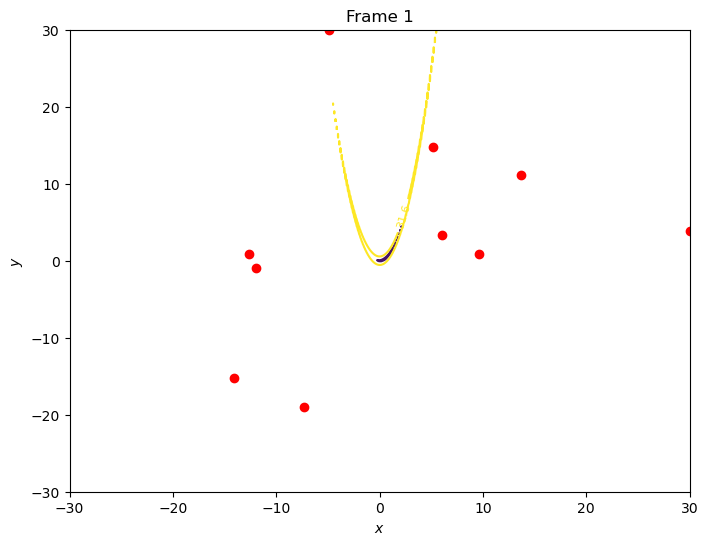

In [7]:
# Crear una malla de puntos en el rango deseado
x = np.linspace(-30, 30, 500)
y = np.linspace(-30, 30, 500)
X, Y = np.meshgrid(x, y)  # Crear la malla 2D

# Calcular la función en cada punto de la malla
Z = rosenbrock((X, Y))

# Inicializar la figura
fig, ax = plt.subplots(figsize=(8, 6))

# Graficar las curvas de nivel de la función de Rosenbrock
contour = ax.contour(X, Y, Z, levels=np.logspace(-10, 1.5, 10), cmap="viridis")
ax.clabel(contour, inline=True, fontsize=8, fmt="%.1f")
ax.set_title("Curvas de nivel de la función de Rosenbrock")
ax.set_xlabel("$x$")
ax.set_ylabel("$y$")

# Función de actualización para la animación
def update(frame):
    ax.clear()  # Limpiar el gráfico anterior
    ax.set_xlim(-30, 30)
    ax.set_ylim(-30, 30)
    
    # Graficar las curvas de nivel de la función de Rosenbrock
    contour = ax.contour(X, Y, Z, levels=np.logspace(-10, 1.5, 10), cmap="viridis")
    ax.clabel(contour, inline=True, fontsize=8, fmt="%.1f")
    
    # Graficar los puntos de GE
    ax.scatter(PopHist[frame][:, 0], PopHist[frame][:, 1], color='red', label="Puntos")
    
    ax.set_title(f"Frame {frame + 1}")
    ax.set_xlabel("$x$")
    ax.set_ylabel("$y$")

# Crear la animación
ani = animation.FuncAnimation(fig, update, frames=len(PopHist), repeat=True, interval=100)

# Guardar la animación como un archivo GIF
ani.save('rosenbrock.gif', writer='imagemagick', fps=10)




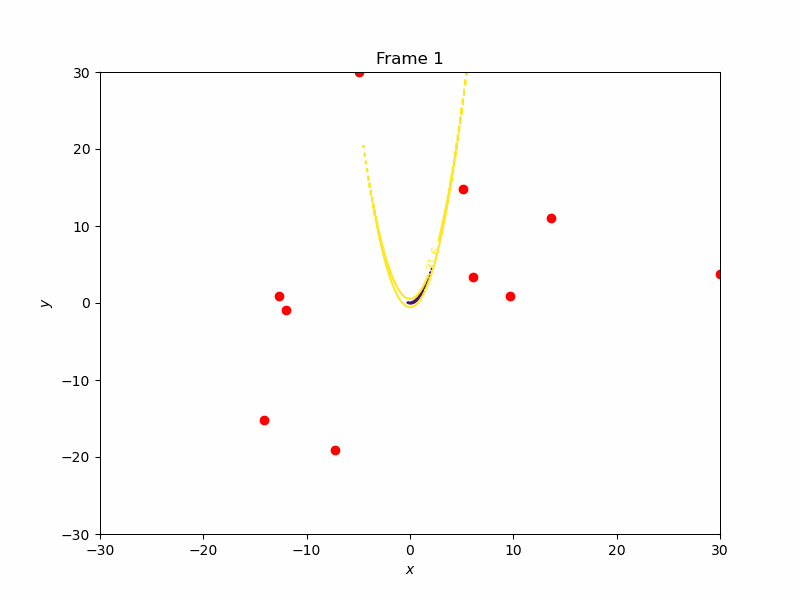

In [8]:
# Mostrar el GIF
display(IPImage(filename='rosenbrock.gif'))

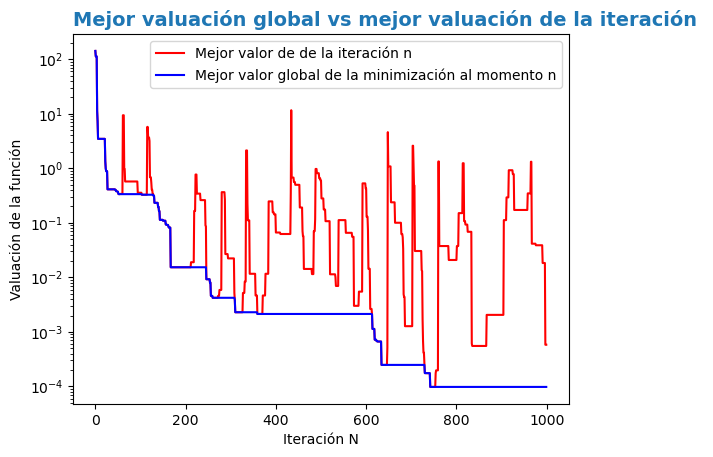

In [9]:
def MejorVal(bestHist,BestPopHist):
    fig, ax = plt.subplots()
    ax.plot(bestHist, color='red', label="Mejor valor de de la iteración n")
    ax.plot(BestPopHist,color='blue', label="Mejor valor global de la minimización al momento n")
    ax.legend(loc = 'upper right')
    ax.set_yscale('log')
    ax.set_title('Mejor valuación global vs mejor valuación de la iteración ', loc = "left", fontdict = {'fontsize':14, 'fontweight':'bold', 'color':'tab:blue'})
    ax.set_xlabel('Iteración N')
    ax.set_ylabel('Valuación de la función')
    plt.show()
MejorVal(bestHist,BestPopHist)

In [10]:

# Parámetros del algoritmo
dim = 2  # Dimensiones del problema
bounds = (-5.12, 5.12)  # Límites del espacio de búsqueda
num_individuals = 10  # Tamaño de la población
max_iter = 100  # Número de iteraciones
c = [0.01, 0.01] # Parámetro de ajuste, en caso de buscarlo fijo colocar el mismo valor en ambos parametros, para mejor resultado en orden descendiente 
Jr = 0.7  # Probabilidad de salto vectorial
Sr = 0.1  # Umbral de refresco
epsilon = 0.01  # Factor de reducción de historia

# Ejecutar el algoritmo GE para rosenbrock
best_position, best_fitness, PopHist, bestHist, BestPopHist  = gradient_evolution(
    rastrigin, dim, bounds, num_individuals, max_iter, c, Jr, Sr, epsilon
)
# Resultados
print("Mejor posición encontrada para rastrigin:", best_position)
print("Fitness de la mejor posición para rastrigin:", best_fitness)

Mejor posición encontrada para rastrigin: [-7.29338482e-06  1.33971375e-05]
Fitness de la mejor posición para rastrigin: 4.616122772915787e-08


MovieWriter imagemagick unavailable; using Pillow instead.


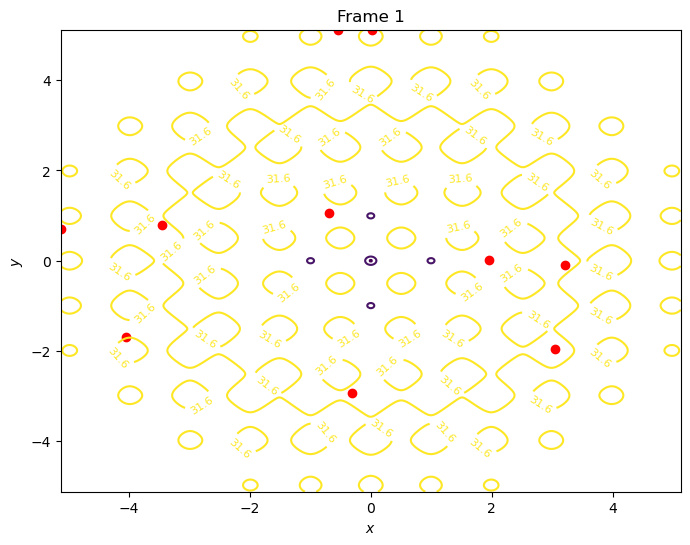

In [11]:
# Crear una malla de puntos en el rango deseado
x = np.linspace(-5.12, 5.12, 500)
y = np.linspace(-5.12, 5.12, 500)
X, Y = np.meshgrid(x, y)  # Crear la malla 2D

# Calcular la función en cada punto de la malla
Z = rastrigin((X, Y))

# Inicializar la figura
fig, ax = plt.subplots(figsize=(8, 6))

# Graficar las curvas de nivel de la función de rastrigin
contour = ax.contour(X, Y, Z, cmap="viridis")
ax.clabel(contour, inline=True, fontsize=8, fmt="%.1f")
ax.set_title("Curvas de nivel de la función de Rastrigin")
ax.set_xlabel("$x$")
ax.set_ylabel("$y$")

# Función de actualización para la animación
def update(frame):
    ax.clear()  # Limpiar el gráfico anterior
    ax.set_xlim(-5.12, 5.12)
    ax.set_ylim(-5.12, 5.12)
    
    # Graficar las curvas de nivel de la función de Rosenbrock
    contour = ax.contour(X, Y, Z, levels=np.logspace(-10, 1.5, 10), cmap="viridis")
    ax.clabel(contour, inline=True, fontsize=8, fmt="%.1f")
    
    # Graficar los puntos de GE
    ax.scatter(PopHist[frame][:, 0], PopHist[frame][:, 1], color='red', label="Puntos")
    
    ax.set_title(f"Frame {frame + 1}")
    ax.set_xlabel("$x$")
    ax.set_ylabel("$y$")

# Crear la animación
ani = animation.FuncAnimation(fig, update, frames=len(PopHist), repeat=True, interval=100)

# Guardar la animación como un archivo GIF
ani.save('rastrigin.gif', writer='imagemagick', fps=5)


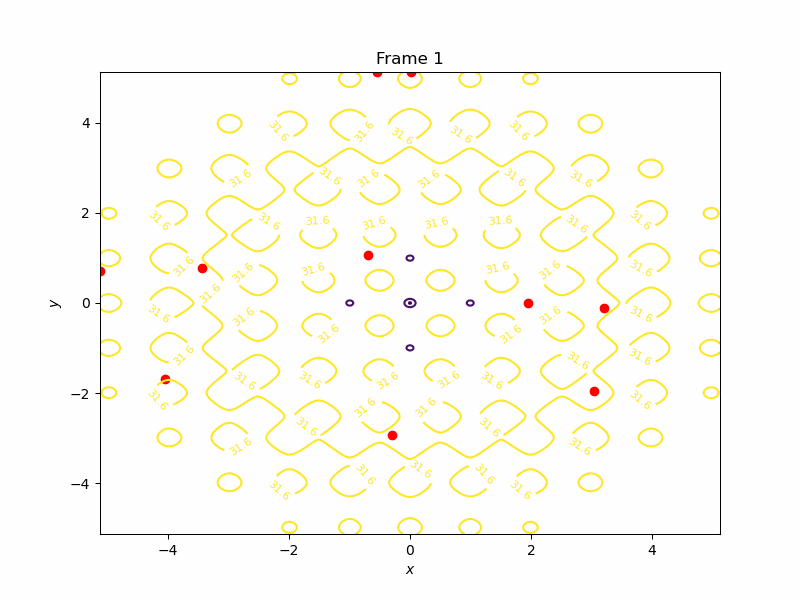

In [12]:
# Mostrar el GIF
display(IPImage(filename='rastrigin.gif'))

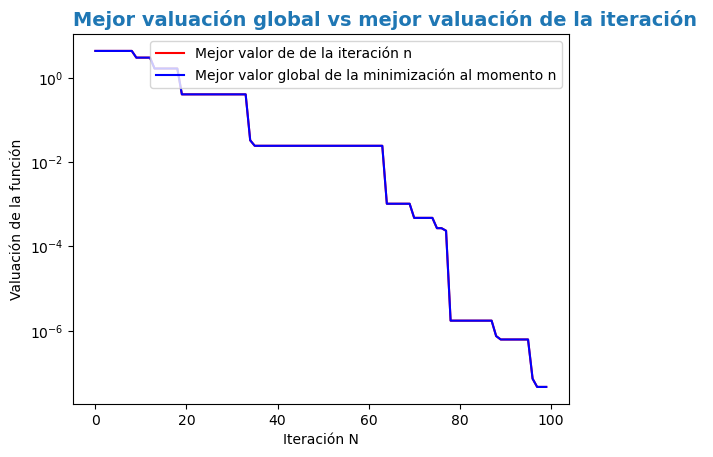

In [13]:
def MejorVal(bestHist,BestPopHist):
    fig, ax = plt.subplots()
    ax.plot(bestHist, color='red', label="Mejor valor de de la iteración n")
    ax.plot(BestPopHist,color='blue', label="Mejor valor global de la minimización al momento n")
    ax.legend(loc = 'upper right')
    ax.set_yscale('log')
    ax.set_title('Mejor valuación global vs mejor valuación de la iteración ', loc = "left", fontdict = {'fontsize':14, 'fontweight':'bold', 'color':'tab:blue'})
    ax.set_xlabel('Iteración N')
    ax.set_ylabel('Valuación de la función')
    plt.show()
MejorVal(bestHist,BestPopHist)

In [18]:
# Parámetros del algoritmo
dim = 2  # Dimensiones del problema
bounds = (-2, 2)  # Límites del espacio de búsqueda
num_individuals = 10  # Tamaño de la población
max_iter = 1000  # Número de iteraciones
c = [0.01, 0.01] # Parámetro de ajuste, en caso de buscarlo fijo colocar el mismo valor en ambos parametros, para mejor resultado en orden descendiente 
Jr = 0.7  # Probabilidad de salto vectorial
Sr = 0.1  # Umbral de refresco
epsilon = 0.01  # Factor de reducción de historia

# Ejecutar el algoritmo GE para HappyCat
best_position, best_fitness, PopHist, bestHist, BestPopHist  = gradient_evolution(
    HappyCat, dim, bounds, num_individuals, max_iter, c, Jr, Sr, epsilon
)
# Resultados
print("Mejor posición encontrada para HappyCat:", best_position)
print("Fitness de la mejor posición para HappyCat:", best_fitness)


Mejor posición encontrada para HappyCat: [-0.91194678 -1.08090381]
Fitness de la mejor posición para HappyCat: 0.014264878135401393


MovieWriter imagemagick unavailable; using Pillow instead.


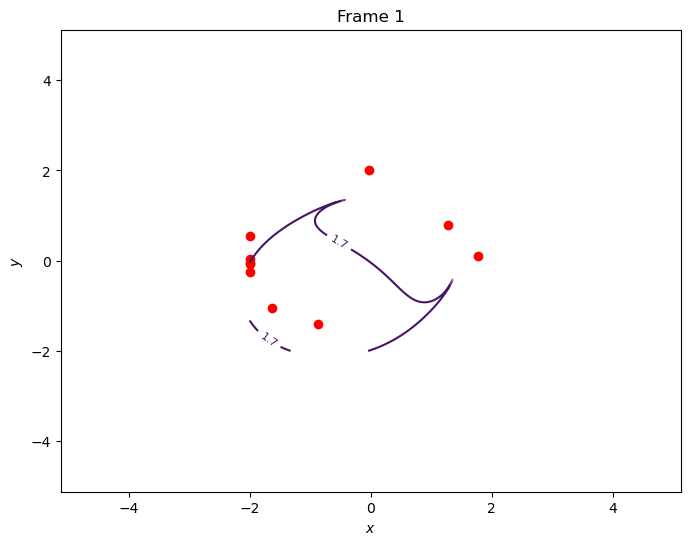

In [19]:
# Crear una malla de puntos en el rango deseado
x = np.linspace(-2, 2, 500)
y = np.linspace(-2, 2, 500)
X, Y = np.meshgrid(x, y)  # Crear la malla 2D

# Calcular la función en cada punto de la malla
Z = HappyCat((X, Y))

# Inicializar la figura
fig, ax = plt.subplots(figsize=(8, 6))

# Graficar las curvas de nivel de la función de rastrigin
contour = ax.contour(X, Y, Z, cmap="viridis")
ax.clabel(contour, inline=True, fontsize=8, fmt="%.1f")
ax.set_title("Curvas de nivel de la función de Rastrigin")
ax.set_xlabel("$x$")
ax.set_ylabel("$y$")

# Función de actualización para la animación
def update(frame):
    ax.clear()  # Limpiar el gráfico anterior
    ax.set_xlim(-5.12, 5.12)
    ax.set_ylim(-5.12, 5.12)
    
    # Graficar las curvas de nivel de la función de Rosenbrock
    contour = ax.contour(X, Y, Z, levels=np.logspace(-10, 1.5, 10), cmap="viridis")
    ax.clabel(contour, inline=True, fontsize=8, fmt="%.1f")
    
    # Graficar los puntos de GE
    ax.scatter(PopHist[frame][:, 0], PopHist[frame][:, 1], color='red', label="Puntos")
    
    ax.set_title(f"Frame {frame + 1}")
    ax.set_xlabel("$x$")
    ax.set_ylabel("$y$")

# Crear la animación
ani = animation.FuncAnimation(fig, update, frames=len(PopHist), repeat=True, interval=100)

# Guardar la animación como un archivo GIF
ani.save('HappyCat.gif', writer='imagemagick', fps=10)


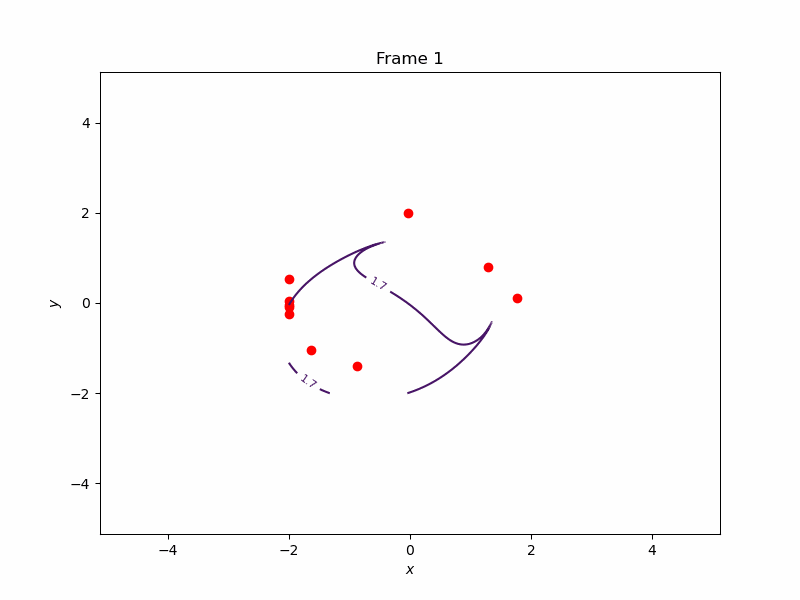

In [20]:
# Mostrar el GIF
display(IPImage(filename='HappyCat.gif'))

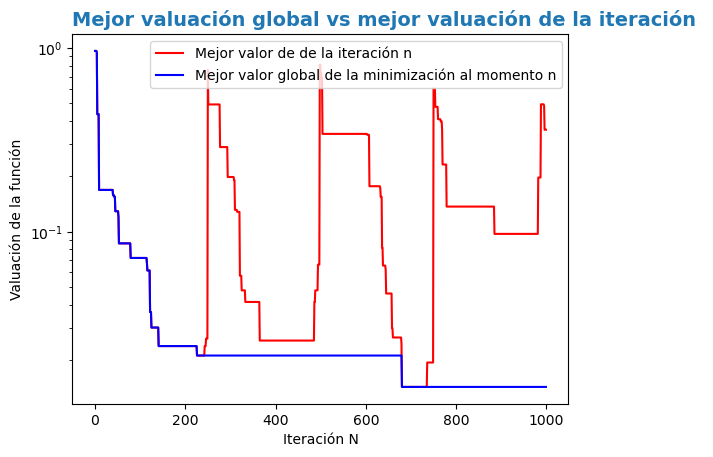

In [21]:
def MejorVal(bestHist,BestPopHist):
    fig, ax = plt.subplots()
    ax.plot(bestHist, color='red', label="Mejor valor de de la iteración n")
    ax.plot(BestPopHist,color='blue', label="Mejor valor global de la minimización al momento n")
    ax.legend(loc = 'upper right')
    ax.set_yscale('log')
    ax.set_title('Mejor valuación global vs mejor valuación de la iteración ', loc = "left", fontdict = {'fontsize':14, 'fontweight':'bold', 'color':'tab:blue'})
    ax.set_xlabel('Iteración N')
    ax.set_ylabel('Valuación de la función')
    plt.show()
MejorVal(bestHist,BestPopHist)